In [1]:
import pickle
import pumpp
import numpy as np
import librosa
import os
from glob import glob

import tensorflow as tf
import keras as K
import pescador
import pandas as pd

from sklearn.cross_validation import LabelShuffleSplit

Using TensorFlow backend.


In [2]:
SEED = 20170319

In [3]:
DATA_DIR = '/home/bmcfee/working/chords/pump'

In [4]:
# Reload the pump
with open('/home/bmcfee/working/chords/pump.pkl', 'rb') as fd:
    pump = pickle.load(fd)

In [5]:
# Calculate the number of frames

MAX_SAMPLES = 128

duration = 4.0

pump.ops[0].sr

n_frames = librosa.time_to_frames(duration,
                                  sr=pump.ops[0].sr,
                                  hop_length=pump.ops[0].hop_length)[0]

sampler = pump.sampler(MAX_SAMPLES, n_frames)

In [6]:
n_frames

43

In [7]:
def data_sampler(fname, sampler):

    data = np.load(fname)
    d2 = dict(data)
    data.close
    data = d2
    
    yield from sampler(data)

In [8]:
def data_generator(tracks, sampler, k, batch_size=16, augmentation=False, **kwargs):
    
    seeds = []
    for track in tracks:
        
        fname = os.path.join(DATA_DIR, os.path.extsep.join([track, 'npz']))
        seeds.append(pescador.Streamer(data_sampler, fname, sampler))
        
        if augmentation:
            for fname in sorted(glob(os.path.join(DATA_DIR, '{}.*.npz'.format(track)))):
                seeds.append(pescador.Streamer(data_sampler, fname, sampler))
        
    # Send it all to a mux
    mux = pescador.Mux(seeds, k, **kwargs)
    
    if batch_size == 1:
        return mux
    else:
        return pescador.BufferedStreamer(mux, batch_size)

# Construct the model

In [9]:
pump.fields

{'chord_struct/bass': Tensor(shape=(None, 13), dtype=<class 'bool'>),
 'chord_struct/pitch': Tensor(shape=(None, 12), dtype=<class 'bool'>),
 'chord_struct/root': Tensor(shape=(None, 13), dtype=<class 'bool'>),
 'chord_tag/chord': Tensor(shape=(None, 170), dtype=<class 'bool'>),
 'cqt/mag': Tensor(shape=(None, 288, 1), dtype=<class 'numpy.float32'>)}

In [10]:
len(pump.ops[1].vocabulary())

170

In [11]:
x = pump.layers()['cqt/mag']

b = K.layers.BatchNormalization()(x)

c0 = K.layers.Convolution2D(1, (5, 5), padding='same',
                            activation='relu',
                            data_format='channels_last')(b)

c1 = K.layers.Convolution2D(48, (1, int(c0.shape[2])), padding='valid', activation='relu',
                            data_format='channels_last')(c0)

r1 = K.layers.Lambda(lambda x: K.backend.squeeze(x, axis=2))(c1)

rs = K.layers.Bidirectional(K.layers.GRU(128, return_sequences=True))(r1)

#hp1 = K.layers.TimeDistributed(K.layers.Dense(1024,
#                                             activation='relu'))(rs)

#hp2 = K.layers.TimeDistributed(K.layers.Dense(512,
#                                             activation='relu'))(hp1)

p1 = K.layers.TimeDistributed(K.layers.Dense(pump.fields['chord_tag/chord'].shape[1],
                                             activation='softmax'))(rs)

model = K.models.Model(x, p1)

# Run a train-test split

In [12]:
index = pd.read_json('/home/bmcfee/working/chords/artist_index.json', typ='series')

for train_, test in LabelShuffleSplit(list(index), n_iter=1, random_state=SEED):
    idx_train_ = index.iloc[train_]
    idx_test = index.iloc[test]
    for train, val in LabelShuffleSplit(list(idx_train_), n_iter=1, test_size=0.25, random_state=SEED):
        idx_train = idx_train_.iloc[train]
        idx_val = idx_train_.iloc[val]
    
        gen_train = data_generator(idx_train.index, sampler, 512, augmentation=True, 
                                   lam=32, batch_size=32, revive=True, random_state=SEED)
        
        gen_val = data_generator(idx_val.index, sampler, len(idx_val),
                                 batch_size=32, revive=True, random_state=SEED)
        

        model.compile(K.optimizers.Adam(), 'categorical_crossentropy', metrics=['accuracy'])

        model.fit_generator(gen_train.tuples('cqt/mag', 'chord_tag/chord'), 512, 100,
                            validation_data=gen_val.tuples('cqt/mag', 'chord_tag/chord'),
                            validation_steps=512,
                            callbacks=[K.callbacks.ModelCheckpoint('/home/bmcfee/working/chords/model_simple_ckpt.pkl',
                                                                   save_best_only=True,
                                                                   verbose=1),
                                       K.callbacks.EarlyStopping(patience=10, verbose=1)])

Epoch 1/100
512/512 [==============================] - 88s - loss: 2.3101 - acc: 0.4390 - val_loss: 1.7537 - val_acc: 0.5412
Epoch 2/100
512/512 [==============================] - 81s - loss: 1.6377 - acc: 0.5526 - val_loss: 1.6799 - val_acc: 0.5529
Epoch 3/100
512/512 [==============================] - 82s - loss: 1.5052 - acc: 0.5866 - val_loss: 1.5679 - val_acc: 0.5746
Epoch 4/100
512/512 [==============================] - 81s - loss: 1.4664 - acc: 0.5943 - val_loss: 1.4995 - val_acc: 0.5900
Epoch 5/100
512/512 [==============================] - 82s - loss: 1.3915 - acc: 0.6137 - val_loss: 1.4910 - val_acc: 0.5921
Epoch 6/100
512/512 [==============================] - 82s - loss: 1.3191 - acc: 0.6245 - val_loss: 1.5149 - val_acc: 0.5831
Epoch 7/100
512/512 [==============================] - 78s - loss: 1.2969 - acc: 0.6304 - val_loss: 1.5279 - val_acc: 0.5808
Epoch 8/100
512/512 [==============================] - 82s - loss: 1.3224 - acc: 0.6298 - val_loss: 1.5275 - val_acc: 0.5883


In [13]:
model.load_weights('/home/bmcfee/working/chords/model_simple_ckpt.pkl')

# Diagnostics

In [14]:
import pandas as pd

In [15]:
import jams.display
import matplotlib.pyplot as plt
%matplotlib nbagg
import librosa.display

<IPython.core.display.Javascript object>


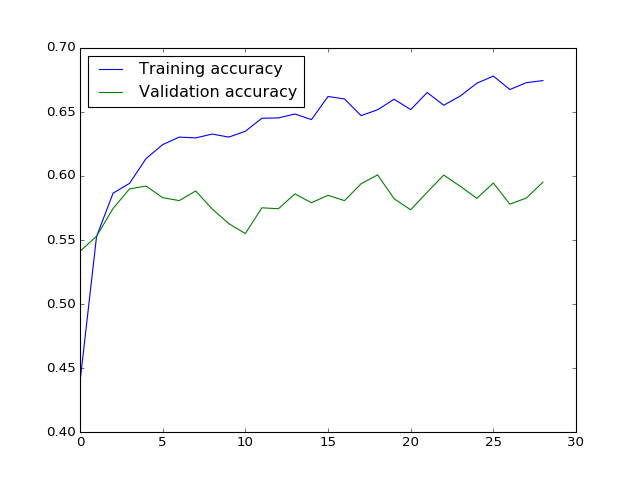

In [16]:
history = pd.DataFrame.from_dict(model.history.history)
plt.figure()

plt.plot(history['acc'], label='Training accuracy')
plt.plot(history['val_acc'], label='Validation accuracy')
plt.legend(loc='best')

In [17]:
l1 = model.get_weights()[4].squeeze()

<IPython.core.display.Javascript object>


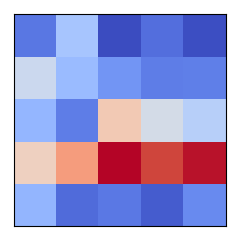

In [18]:
plt.figure(figsize=(3,3))

librosa.display.specshow(l1.T, vmin=l1.min(), vmax=l1.max())
    
plt.tight_layout()

In [19]:
l2 = model.get_weights()[6].squeeze()
l2 = librosa.util.axis_sort(l2)

<IPython.core.display.Javascript object>


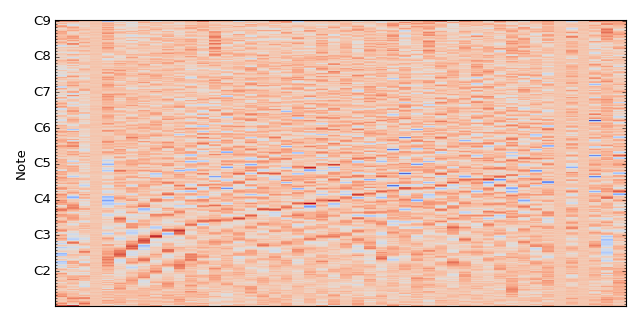

In [20]:
plt.figure(figsize=(8,4))
librosa.display.specshow(l2, y_axis='cqt_note', sr=pump.ops[0].sr, bins_per_octave=36)
plt.tight_layout()

---
# Validation viz

In [21]:
import pandas as pd
import jams

from tqdm import tqdm_notebook as tqdm

In [22]:
def score_model(pump, model, idx,
                features='/home/bmcfee/working/chords/pump',
                refs='/home/bmcfee/data/eric_chords/references_v2/'):
    
    results = {}
    for item in tqdm(idx.index):
        jam = jams.load('{}/{}.jams'.format(refs, item), validate=False)
        datum = np.load('{}/{}.npz'.format(features, item))['cqt/mag']
        
        ann = pump.ops[1].inverse(model.predict(datum)[0])
        results[item] = jams.eval.chord(jam.annotations['chord', 0], ann)
        
    return pd.DataFrame.from_dict(results, orient='index')

In [23]:
df = score_model(pump, model, idx_test)

In [61]:
dfr = df[['thirds', 'triads', 'tetrads', 'root', 'mirex', 'majmin', 'sevenths']]

In [66]:
dfr.describe()

,thirds,triads,tetrads,root,mirex,majmin,sevenths
count,225.000000,225.000000,225.000000,225.000000,225.000000,225.000000,225.000000
mean,0.734432,0.695752,0.553092,0.767820,0.783657,0.758166,0.615090
std,0.167506,0.201706,0.210039,0.142928,0.139064,0.166320,0.194131
min,0.016562,0.016562,0.004510,0.111830,0.084471,0.016562,0.004510
25%,0.646352,0.599146,0.422534,0.683933,0.721410,0.676999,0.509292
50%,0.772001,0.746941,0.582585,0.800992,0.807642,0.793835,0.636341
75%,0.854613,0.840276,0.704890,0.870020,0.877622,0.871856,0.747528
max,0.985297,0.985297,0.948432,0.985297,0.994339,0.994339,0.994339


<IPython.core.display.Javascript object>


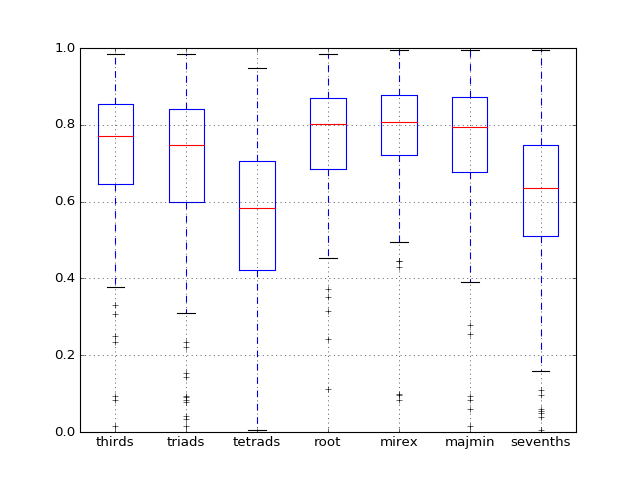

/home/bmcfee/miniconda/envs/py34/lib/python3.4/site-packages/ipykernel/__main__.py:2: FutureWarning: 
The default value for 'return_type' will change to 'axes' in a future release.
 To use the future behavior now, set return_type='axes'.
 To keep the previous behavior and silence this warning, set return_type='dict'.
  from ipykernel import kernelapp as app


In [64]:
plt.figure()
dfr.boxplot();

In [67]:
F = idx_val.index[30]

In [83]:
F = df['sevenths'].argmin()

In [84]:
F

'TRELLOA149E39B296C'

In [85]:
datum = np.load('/home/bmcfee/working/chords/pump/{}.npz'.format(F))

In [86]:
J = jams.load('/home/bmcfee/data/eric_chords/references_v2/{}.jams'.format(F))

In [87]:
ann_true = pump['chord_tag'].inverse(datum['chord_tag/chord'][0])

In [88]:
ann = pump['chord_tag'].inverse(model.predict(datum['cqt/mag'])[0])

In [89]:
pd.DataFrame.from_records([jams.eval.chord(J.annotations['chord', 0], ann)]).loc[0]

majmin          0.016562
majmin_inv      0.016562
mirex           0.495566
root            0.872495
sevenths        0.004510
sevenths_inv    0.004510
tetrads         0.004510
tetrads_inv     0.004510
thirds          0.016562
thirds_inv      0.016562
triads          0.016562
triads_inv      0.016562
Name: 0, dtype: float64

<IPython.core.display.Javascript object>


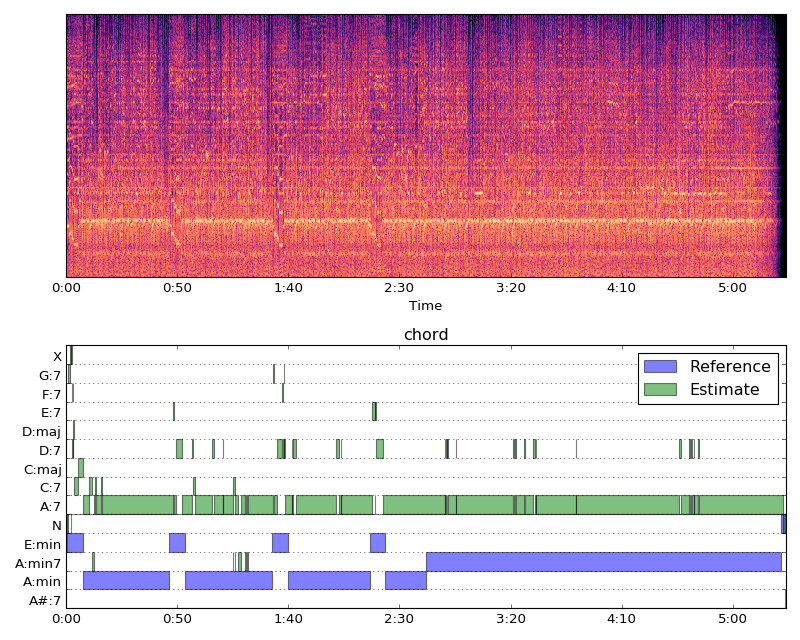

In [90]:
plt.figure(figsize=(10, 8))

ax = plt.subplot(2,1,1)
librosa.display.specshow(datum['cqt/mag'][0, :, :, 0].T,
                         sr=pump.ops[0].sr,
                         hop_length=pump.ops[0].hop_length,
                         x_axis='time')

plt.subplot(2,1,2, sharex=ax)
jams.display.display(ann_true, meta=False, label='Reference', alpha=0.5)
jams.display.display(ann, meta=False, label='Estimate', alpha=0.5)
plt.legend()
plt.tight_layout()

In [91]:
from IPython.display import Audio

In [92]:
import jams

In [93]:
import librosa

In [94]:
y, sr = librosa.load('/home/bmcfee/data/eric_chords/audio/{}.mp3'.format(F))

In [95]:
Audio(data=y + jams.sonify.sonify(ann, sr=sr, duration=int(np.ceil(len(y) / sr)))[:len(y)], rate=sr)